In [1]:
import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import pylab
from scipy.optimize import curve_fit, fmin, minimize
import os
import pandas as pd
from scipy.interpolate import interp1d
from qutip import *
%matplotlib inline

def lorentzian_func(f, A, f_r, Q, c):
    return A*(f_r/Q)/(((f_r/Q)**2 + 4*(f-f_r)**2))**0.5 + c

def lin_func(x, a, b):
    return a*x + b

def quadratic_func(x, a, b, c):
    return a*(x-b)**2 + c

def lorentzian_fit(spectrum):
    max_idx = np.argmax(spectrum).values[()]
    A_est = spectrum[max_idx]
    Q_est = 10000
    try:
        f_r_est = spectrum.frequency[max_idx]
        popt, pcov = curve_fit(lorentzian_func, spectrum.frequency, spectrum.values, p0=[A_est, f_r_est, Q_est, 0.01])
    except:
        f_r_est = spectrum.f_d[max_idx]
        popt, pcov = curve_fit(lorentzian_func, spectrum.f_d, spectrum.values, p0=[A_est, f_r_est, Q_est, 0.01])        
    return popt, pcov

def Q_calc(spectrum, display=False):
    popt, pcov = lorentzian_fit(spectrum)
    Q_factor = popt[2]

    if display:
        fig, axes = plt.subplots(1,1)
        spectrum.plot(ax=axes)
        try:
            axes.plot(spectrum.frequency, lorentzian_func(spectrum.frequency, *popt), 'g--')
        except:
            axes.plot(spectrum.f_d, lorentzian_func(spectrum.f_d, *popt), 'g--')

    return Q_factor, np.sqrt(pcov[2,2])

def peak_finder(dataframe, N=1, display=False):
    if display:
        fig, axes = plt.subplots(1,1)
    n_powers = dataframe.shape[1]
    peak_indices = []
    peak_values = []
    for idx in range(n_powers):
        cut = dataframe.iloc[:,idx]
        cut = cut.dropna()
        smoothed_index = np.convolve(cut.index, np.ones((N,))/N, mode='valid')
        smoothed_data = np.convolve(cut.values, np.ones((N,))/N, mode='valid')
        interp_func = interp1d(smoothed_index, smoothed_data, kind='cubic')
        fine_indices = np.linspace(smoothed_index[0],smoothed_index[-1],2001)
        fine_values = interp_func(fine_indices)
        max_idx = np.argmax(fine_values)
        peak_indices.append(fine_indices[max_idx])
        peak_values.append(fine_values[max_idx])
        if display:
            #cut.plot(ax=axes)
            axes.plot(fine_indices,fine_values)
    peak_array = np.array([peak_indices, peak_values]).T
    peak_frame = pd.DataFrame(peak_array, index=dataframe.columns, columns=['frequency','value'])
    if display:
        axes.scatter(peak_frame['frequency'],peak_frame['value'])
    return peak_frame


def load_simulated(sweep_path, display=True):


    fig, axes = plt.subplots(1, 1)

    bottom_levels = []
    for idx, (dirpath, dirnames, filenames) in enumerate(os.walk(sweep_path)):
        if not dirnames:
            bottom_levels.append(dirpath)

    transmissions = np.array([])
    frequencies = np.array([])
    drives = np.array([])

    spectrum = None
    legend_content = []
    collected_results = None
    cut_list = []

    for bottom_path in bottom_levels:
        results = pd.read_hdf(bottom_path + '/results.h5')
        params = qload(bottom_path + '/params')
        results = results.set_index('fd_points')
        a_abs = np.abs(results['a'])
        a_abs.plot(ax=axes)
        marker = str(1000*params.eps)
        legend_content.append(marker)
        results['epsilon'] = params.eps
        if collected_results is None:
            collected_results = results
        else:
            collected_results = pd.concat([collected_results,results])
        a_abs.name = params.eps
        cut_list.append(a_abs)

    collected_results.set_index('epsilon', append=True, inplace=True)

    simulated_results = pd.concat(cut_list, axis=1)
    return simulated_results
    peak_frame = peak_finder(simulated_results,N=1)
    eps_array = simulated_results.columns
    
    return peak_frame
    freq_array = peak_frame['frequency']

    axes.scatter(freq_array, peak_frame['values'])

    legend = axes.legend(legend_content)
    legend.set_title(r'$\epsilon$ / MHz')
    
    return simulated_results


def load_experimental(path, display=True):
    dataframe = pd.read_csv(path, skiprows=5, sep='\t')
    index = pd.read_csv(path, skiprows=3, sep='\t', nrows=1, header=None)
    index = index.T[0].astype(np.float)
    dataframe.index = index.values
    dataframe = dataframe.T
    dataframe.index = dataframe.index.astype(np.float)*1e-9 + 0.125
    dataframe = dataframe.iloc[:, ::-1]
    if display:
        fig, axes = plt.subplots(1,1)
        dataframe.iloc[:,:].plot(ax=axes)
    return dataframe


import mpld3
mpld3.enable_notebook()
%matplotlib inline
pylab.rcParams['figure.figsize'] = (13, 8)

When Giovanna carries out an experiment she measures the strength of the cavity drive in decibel-milliwatts ie the power of the drive signal relative to 1 milliwatt. On the other hand I measure the strength of the cavity drive by the parameter $\epsilon$ in the Hamiltonian. This parameter has units of frequency. I must find a way to map between them.  

In general the drive power, $P$, is related to $\epsilon$ via $P = A \epsilon^2$ for some coefficient $A$. The power in dBm, D, is given by  

$$D=10\log_{10}(P/mW) = 10\log_{10}(A) + 20\log_{10}(\epsilon/MHz)$$  
I must find $A$. In order to solve this problem I examine Giovanna's cavity spectra to extract the dependence of the resonance frequency on the drive power. I then use my simulations to see how the resonance frequency depends on $\epsilon$. I can then create a function which maps between the two.

## Load experimental spectra ##

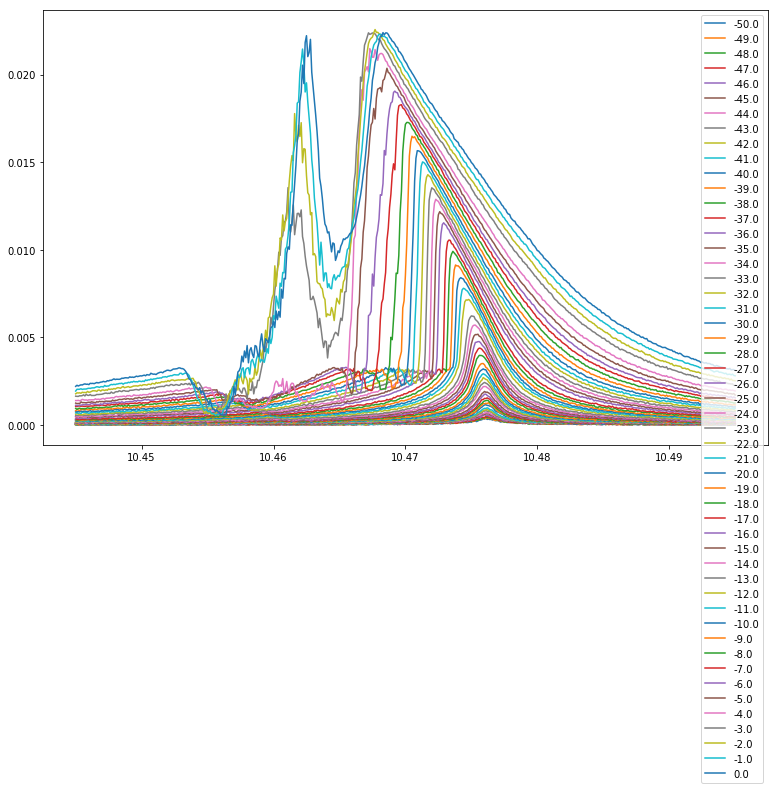

In [2]:
path = './spectra/CavC_Spectroscopy_hpulse.txt'
dataframe = load_experimental(path)

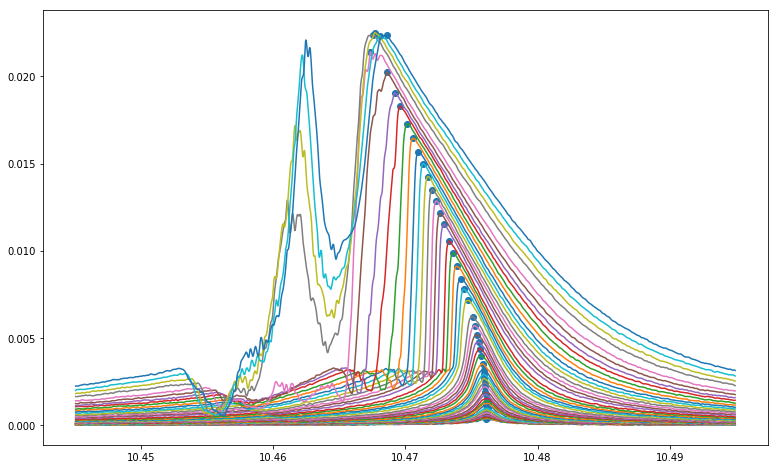

In [3]:
peaks_exp = peak_finder(dataframe, display=True, N=2)

## Load simulated spectra ##

/homes/pbrookes/anaconda2/envs/bistable/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.


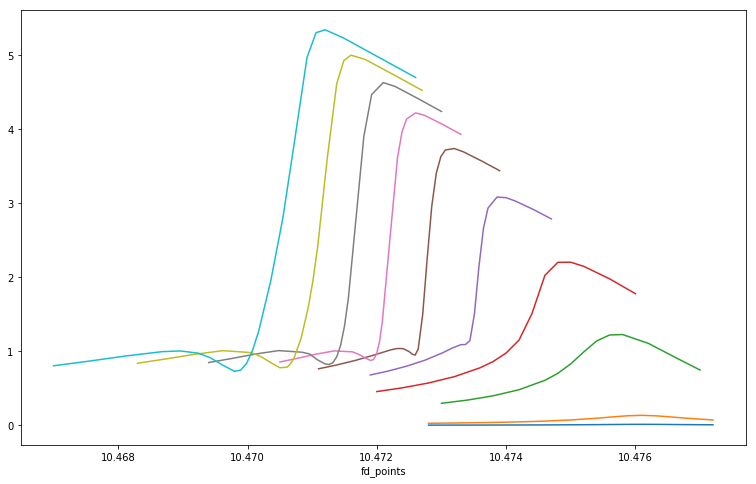

In [4]:
simulated_results = load_simulated('cuts_temperature')

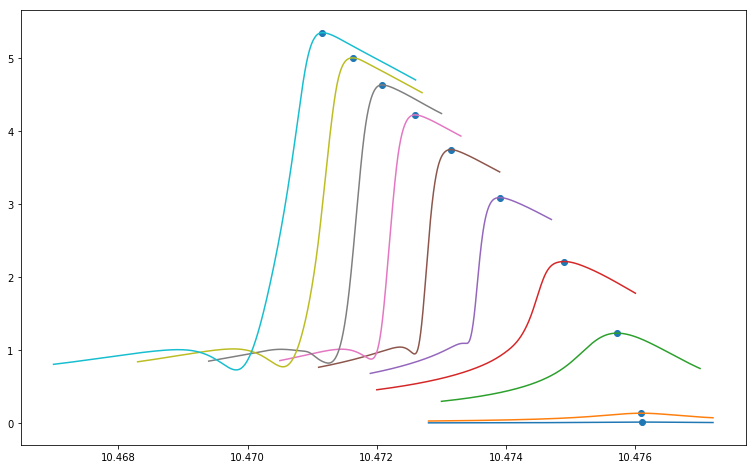

In [5]:
peaks_sim = peak_finder(simulated_results,N=1,display=True)

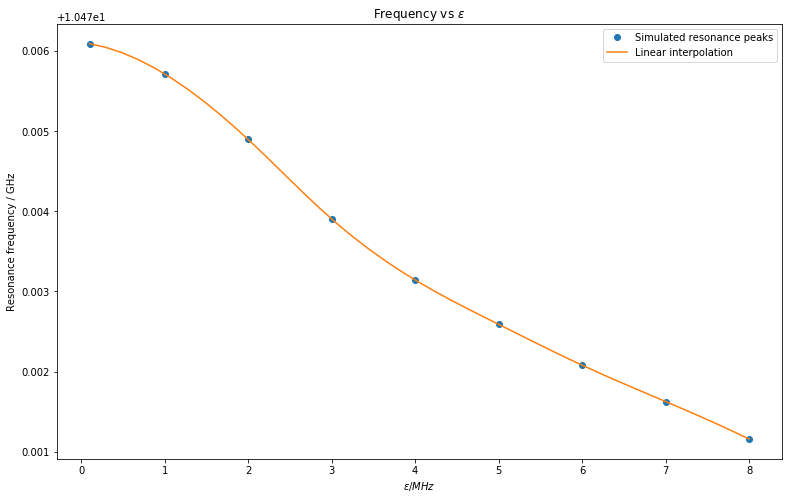

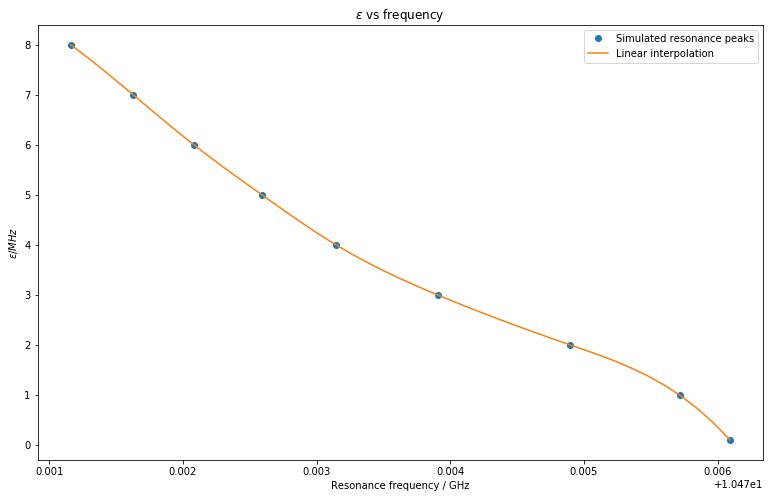

In [14]:
x = peaks_sim.index[1:]
y = peaks_sim['frequency'].values[1:]


eps_to_freq = interp1d(x, y, kind='cubic', fill_value='extrapolate')
xnew = np.linspace(x[0], x[-1], num=41, endpoint=True)
plt.plot(1000*x, y, 'o', 1000*xnew, eps_to_freq(xnew))
plt.legend(['Simulated resonance peaks', 'Linear interpolation'], loc='best')
plt.xlabel(r'$\epsilon / MHz$')
plt.ylabel('Resonance frequency / GHz')
plt.title('Frequency vs $\epsilon$')
plt.show()


freq_to_eps = interp1d(y, x, kind='cubic', fill_value='extrapolate')
ynew = np.linspace(y[0], y[-1], num=41, endpoint=True)
import matplotlib.pyplot as plt
plt.plot(y, 1000*x, 'o', ynew, 1000*freq_to_eps(ynew))
plt.legend(['Simulated resonance peaks', 'Linear interpolation'], loc='best')
plt.ylabel('$\epsilon / MHz$')
plt.xlabel('Resonance frequency / GHz')
plt.title('$\epsilon$ vs frequency')
plt.show()

In [16]:
frequencies = peaks_exp['frequency'].values
powers = np.array(peaks_exp.index)
freq_to_power = interp1d(frequencies,powers)
power_to_freq = interp1d(powers,frequencies)

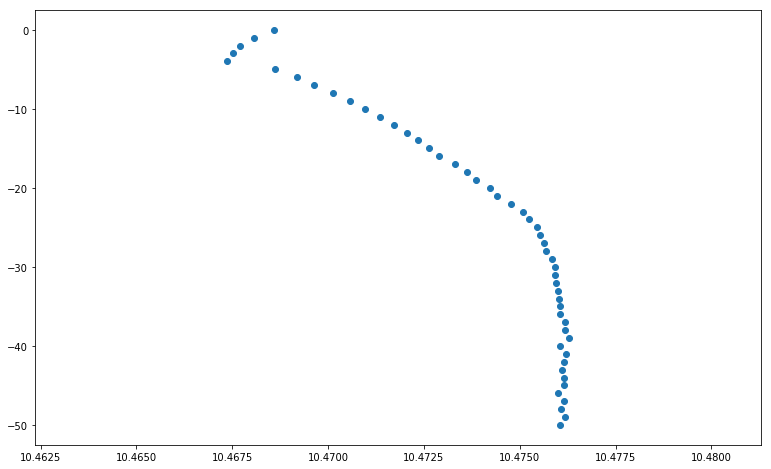

In [17]:
fig, axes = plt.subplots(1,1)

axes.scatter(frequencies, powers)

In [ ]:
trial_powers = np.arange(-20,-9)
freq_to_eps(power_to_freq(trial_powers))

In [ ]:
freq_to_power(eps_to_freq(eps))

## Mapping between $\epsilon$ and power in decibels ##

linear coefficient = 8.387390069675746
offset = 29.747700171201707


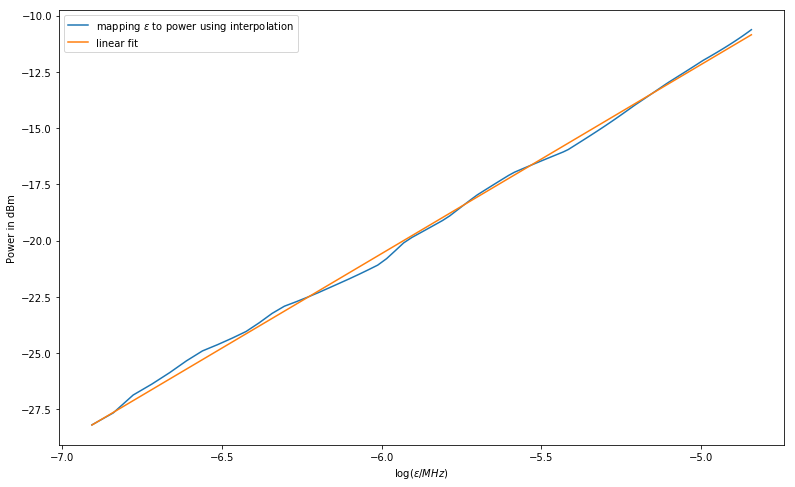

In [18]:
def eps_to_power(eps):
    power = freq_to_power(eps_to_freq(eps))
    return power

def power_to_eps(power):
    eps = freq_to_eps(power_to_freq(power))
    return eps

def lin_func_single(x, a):
    return 20*x/np.log(10) + a

eps = np.linspace(0.001,0.0079,101)
powers = freq_to_power(eps_to_freq(eps))
popt, pcov = curve_fit(lin_func, np.log(eps), powers)
plt.plot(np.log(eps),powers)
plt.plot(np.log(eps),lin_func(np.log(eps),*popt))
plt.xlabel('$\log(\epsilon/MHz)$')
plt.ylabel('Power in dBm')
plt.legend(['mapping $\epsilon$ to power using interpolation', 'linear fit'])
print 'linear coefficient = ' + str(popt[0])
print 'offset = ' + str(popt[1])

The expected linear coefficient is $20/\log(10)=8.686$.  

$D = B \log(\epsilon) + C$ where $B=8.696$ and $C=20.42$.

In [19]:
np.exp(np.log(10)*(-25-20.36)/20)

0.005395106225151276

31.402788849413625


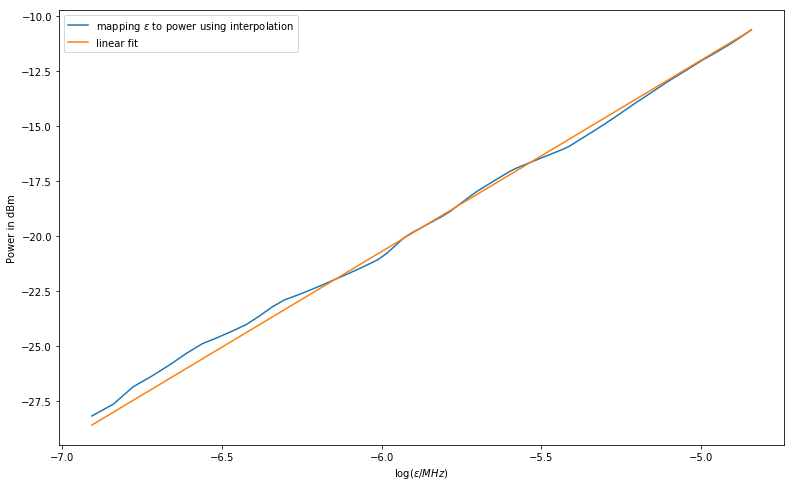

In [20]:
eps = np.linspace(0.001,0.0079,101)
powers = freq_to_power(eps_to_freq(eps))
popt, pcov = curve_fit(lin_func_single, np.log(eps), powers)
plt.plot(np.log(eps),powers)
plt.plot(np.log(eps),lin_func_single(np.log(eps),*popt))
plt.xlabel('$\log(\epsilon/MHz)$')
plt.ylabel('Power in dBm')
plt.legend(['mapping $\epsilon$ to power using interpolation', 'linear fit'])
print popt[0]
calc_params = [20/np.log(10), popt[0]]

def epsilon_calc(power, a, b):
    eps = np.exp((power - b)/a)
    return eps

In [21]:
epsilon_calc(np.arange(-60, -31), *calc_params)

array([2.69067075e-05, 3.01898224e-05, 3.38735378e-05, 3.80067345e-05,
       4.26442575e-05, 4.78476439e-05, 5.36859395e-05, 6.02366148e-05,
       6.75865935e-05, 7.58334051e-05, 8.50864800e-05, 9.54686008e-05,
       1.07117532e-04, 1.20187848e-04, 1.34852983e-04, 1.51307535e-04,
       1.69769847e-04, 1.90484901e-04, 2.13727575e-04, 2.39806283e-04,
       2.69067075e-04, 3.01898224e-04, 3.38735378e-04, 3.80067345e-04,
       4.26442575e-04, 4.78476439e-04, 5.36859395e-04, 6.02366148e-04,
       6.75865935e-04])

In [22]:
epsilon_calc(dataframe.columns, *calc_params)

Float64Index([ 8.5086480024e-05, 9.54686007985e-05, 0.000107117531902,
              0.000120187847574,  0.00013485298296, 0.000151307535499,
              0.000169769847105, 0.000190484901436, 0.000213727574677,
              0.000239806282981, 0.000269067074962, 0.000301898223553,
              0.000338735378147, 0.000380067345406, 0.000426442575423,
              0.000478476439325, 0.000536859394871, 0.000602366148411,
              0.000675865934763, 0.000758334051439,  0.00085086480024,
              0.000954686007985,  0.00107117531902,  0.00120187847574,
                0.0013485298296,  0.00151307535499,  0.00169769847105,
               0.00190484901436,  0.00213727574677,  0.00239806282981,
               0.00269067074962,  0.00301898223553,  0.00338735378147,
               0.00380067345406,  0.00426442575423,  0.00478476439325,
               0.00536859394871,  0.00602366148411,  0.00675865934763,
               0.00758334051439,   0.0085086480024,  0.00954686007985,
      

In [23]:
epsilon_calc(np.flip(np.array(dataframe.columns),axis=0), *calc_params)

array([2.69067075e-02, 2.39806283e-02, 2.13727575e-02, 1.90484901e-02,
       1.69769847e-02, 1.51307535e-02, 1.34852983e-02, 1.20187848e-02,
       1.07117532e-02, 9.54686008e-03, 8.50864800e-03, 7.58334051e-03,
       6.75865935e-03, 6.02366148e-03, 5.36859395e-03, 4.78476439e-03,
       4.26442575e-03, 3.80067345e-03, 3.38735378e-03, 3.01898224e-03,
       2.69067075e-03, 2.39806283e-03, 2.13727575e-03, 1.90484901e-03,
       1.69769847e-03, 1.51307535e-03, 1.34852983e-03, 1.20187848e-03,
       1.07117532e-03, 9.54686008e-04, 8.50864800e-04, 7.58334051e-04,
       6.75865935e-04, 6.02366148e-04, 5.36859395e-04, 4.78476439e-04,
       4.26442575e-04, 3.80067345e-04, 3.38735378e-04, 3.01898224e-04,
       2.69067075e-04, 2.39806283e-04, 2.13727575e-04, 1.90484901e-04,
       1.69769847e-04, 1.51307535e-04, 1.34852983e-04, 1.20187848e-04,
       1.07117532e-04, 9.54686008e-05, 8.50864800e-05])

In [24]:
epsilon_calc(np.arange(-31, -21), *calc_params)

array([0.00075833, 0.00085086, 0.00095469, 0.00107118, 0.00120188,
       0.00134853, 0.00151308, 0.0016977 , 0.00190485, 0.00213728])

In [25]:
epsilon_calc(np.arange(-21, -14), *calc_params)

array([0.00239806, 0.00269067, 0.00301898, 0.00338735, 0.00380067,
       0.00426443, 0.00478476])

In [26]:
powers = np.arange(-20,-9)

In [27]:
freq_to_eps(power_to_freq(powers))

array([0.00266514, 0.00304213, 0.00333483, 0.00373371, 0.00443115,
       0.00494409, 0.00546806, 0.00607245, 0.00678645, 0.00761325,
       0.00834006])

Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.


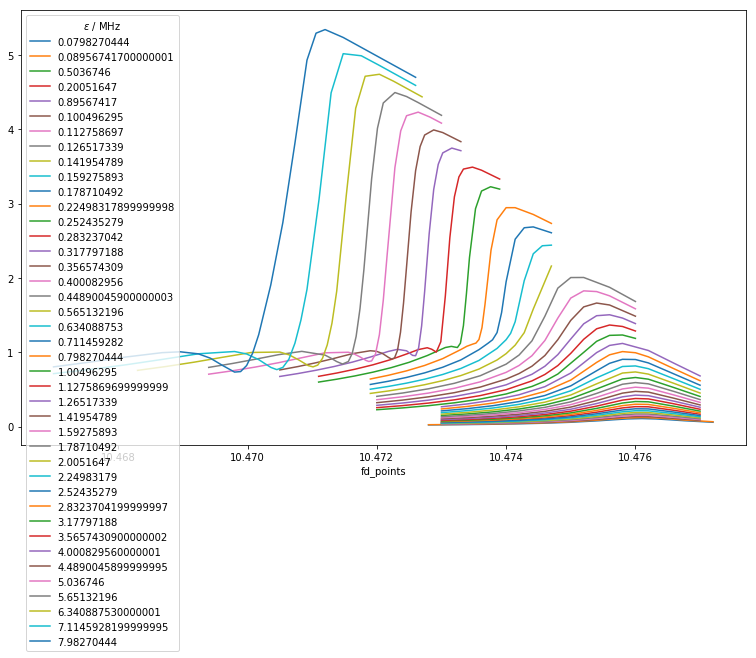

In [41]:
sweep_path = 'matched_cuts_temperature'

fig, axes = plt.subplots(1, 1)

bottom_levels = []
for idx, (dirpath, dirnames, filenames) in enumerate(os.walk(sweep_path)):
    if not dirnames:
        bottom_levels.append(dirpath)
                    
transmissions = np.array([])
frequencies = np.array([])
drives = np.array([])

spectrum = None
legend_content = []
collected_results = None
cut_list = []

for bottom_path in bottom_levels:
    results = pd.read_hdf(bottom_path + '/results.h5')
    params = qload(bottom_path + '/params')
    results = results.set_index('fd_points')
    a_abs = np.abs(results['a'])
    a_abs.plot(ax=axes)
    marker = str(1000*params.eps)
    legend_content.append(marker)
    results['epsilon'] = params.eps
    
legend = axes.legend(legend_content)
legend.set_title(r'$\epsilon$ / MHz')

Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.
Loaded instance object.


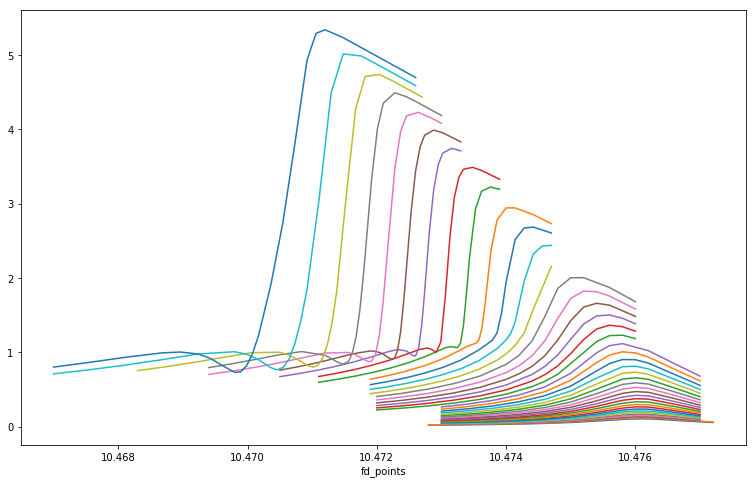

In [29]:
matched_cuts = load_simulated('matched_cuts_temperature')
matched_cuts.sort_index(axis=1, inplace=True)

In [30]:
np.array(peak_finder(matched_cuts).index)

array([7.98270444e-05, 8.95674170e-05, 1.00496295e-04, 1.12758697e-04,
       1.26517339e-04, 1.41954789e-04, 1.59275893e-04, 1.78710492e-04,
       2.00516470e-04, 2.24983179e-04, 2.52435279e-04, 2.83237042e-04,
       3.17797188e-04, 3.56574309e-04, 4.00082956e-04, 4.48900459e-04,
       5.03674600e-04, 5.65132196e-04, 6.34088753e-04, 7.11459282e-04,
       7.98270444e-04, 8.95674170e-04, 1.00496295e-03, 1.12758697e-03,
       1.26517339e-03, 1.41954789e-03, 1.59275893e-03, 1.78710492e-03,
       2.00516470e-03, 2.24983179e-03, 2.52435279e-03, 2.83237042e-03,
       3.17797188e-03, 3.56574309e-03, 4.00082956e-03, 4.48900459e-03,
       5.03674600e-03, 5.65132196e-03, 6.34088753e-03, 7.11459282e-03,
       7.98270444e-03])

In [31]:
matched_cuts.columns.values

array([7.98270444e-05, 8.95674170e-05, 1.00496295e-04, 1.12758697e-04,
       1.26517339e-04, 1.41954789e-04, 1.59275893e-04, 1.78710492e-04,
       2.00516470e-04, 2.24983179e-04, 2.52435279e-04, 2.83237042e-04,
       3.17797188e-04, 3.56574309e-04, 4.00082956e-04, 4.48900459e-04,
       5.03674600e-04, 5.65132196e-04, 6.34088753e-04, 7.11459282e-04,
       7.98270444e-04, 8.95674170e-04, 1.00496295e-03, 1.12758697e-03,
       1.26517339e-03, 1.41954789e-03, 1.59275893e-03, 1.78710492e-03,
       2.00516470e-03, 2.24983179e-03, 2.52435279e-03, 2.83237042e-03,
       3.17797188e-03, 3.56574309e-03, 4.00082956e-03, 4.48900459e-03,
       5.03674600e-03, 5.65132196e-03, 6.34088753e-03, 7.11459282e-03,
       7.98270444e-03])

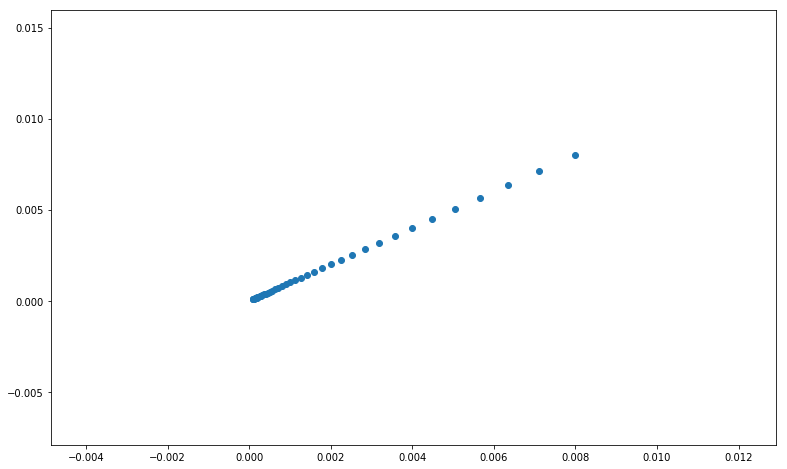

In [32]:
fig, axes = plt.subplots(1,1)

axes.scatter(np.array(peak_finder(matched_cuts).index),matched_cuts.columns.values)

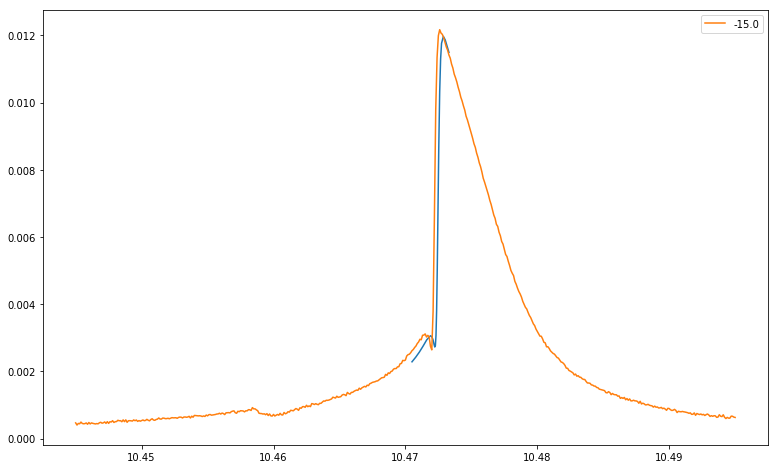

In [33]:
fig, axes = plt.subplots(1,1)
scale = 3.0e-3

lower = 35
upper = 36

for i in range(lower,upper):
    cut = scale*matched_cuts.iloc[:,i]
    cut = cut.dropna()
    axes.plot(cut.index, cut)

dataframe.iloc[:,lower:upper].plot(ax=axes)

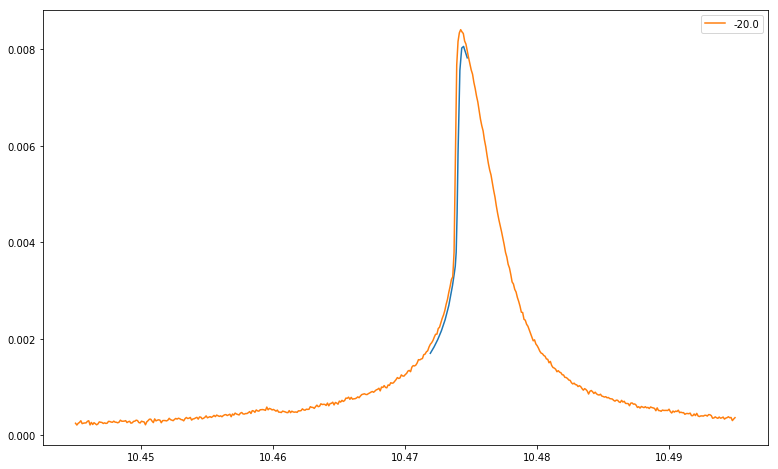

In [34]:
fig, axes = plt.subplots(1,1)
scale = 3.0e-3

lower = 30
upper = 31

for i in range(lower,upper):
    cut = scale*matched_cuts.iloc[:,i]
    cut = cut.dropna()
    axes.plot(cut.index, cut)

dataframe.iloc[:,lower:upper].plot(ax=axes)

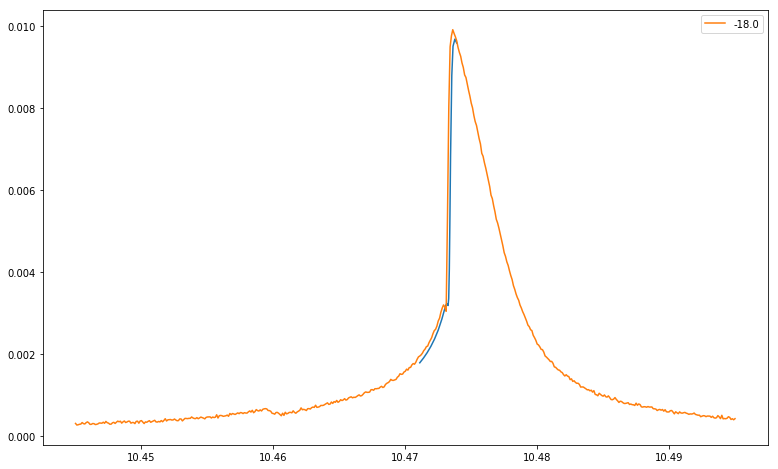

In [35]:
fig, axes = plt.subplots(1,1)
scale = 3.0e-3

lower = 32
upper = 33

for i in range(lower,upper):
    cut = scale*matched_cuts.iloc[:,i]
    cut = cut.dropna()
    axes.plot(cut.index, cut)

dataframe.iloc[:,lower:upper].plot(ax=axes)

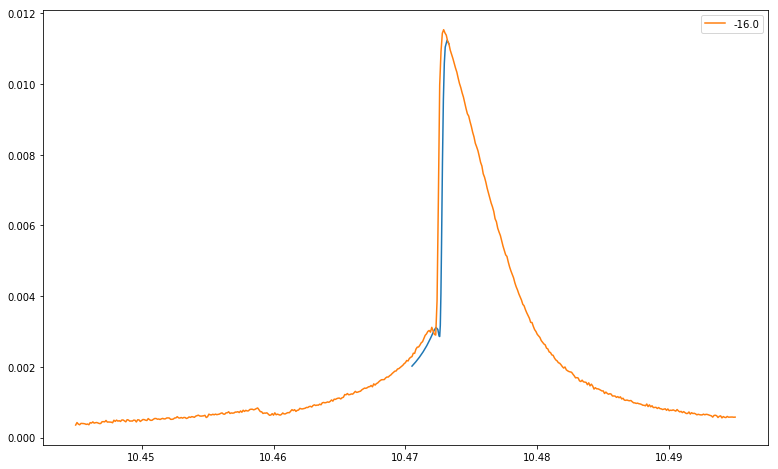

In [36]:
fig, axes = plt.subplots(1,1)
scale = 3.0e-3

lower = 34
upper = 35

for i in range(lower,upper):
    cut = scale*matched_cuts.iloc[:,i]
    cut = cut.dropna()
    axes.plot(cut.index, cut)

dataframe.iloc[:,lower:upper].plot(ax=axes)

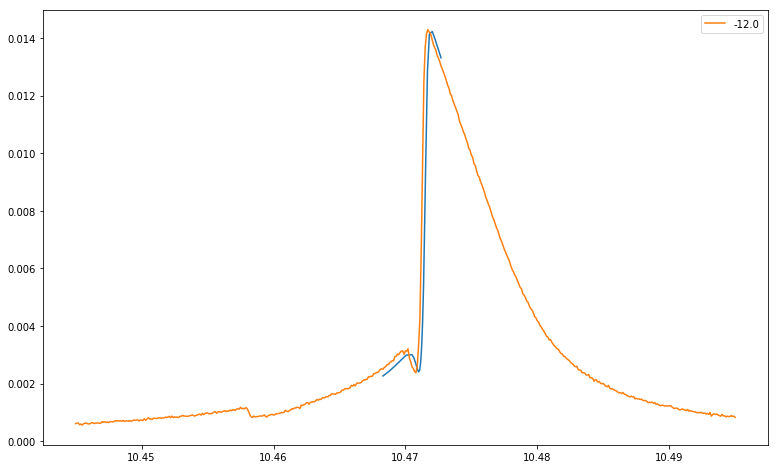

In [37]:
fig, axes = plt.subplots(1,1)
scale = 3.0e-3

lower = 38
upper = 39

for i in range(lower,upper):
    cut = scale*matched_cuts.iloc[:,i]
    cut = cut.dropna()
    axes.plot(cut.index, cut)

dataframe.iloc[:,lower:upper].plot(ax=axes)

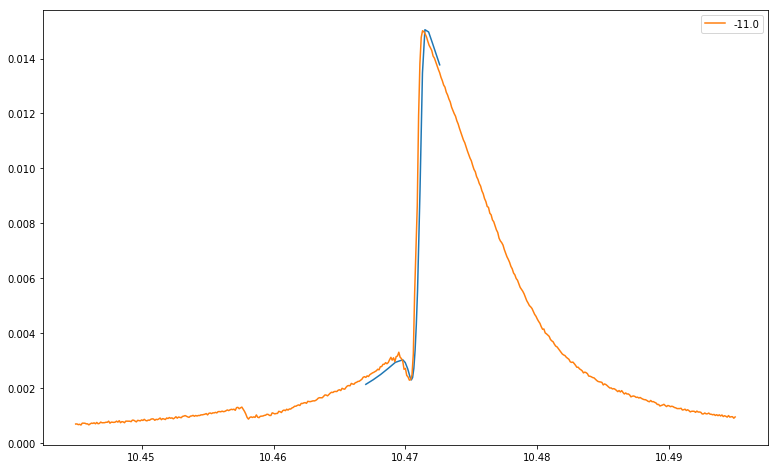

In [38]:
fig, axes = plt.subplots(1,1)
scale = 3.0e-3

lower = 39
upper = 40

for i in range(lower,upper):
    cut = scale*matched_cuts.iloc[:,i]
    cut = cut.dropna()
    axes.plot(cut.index, cut)

dataframe.iloc[:,lower:upper].plot(ax=axes)

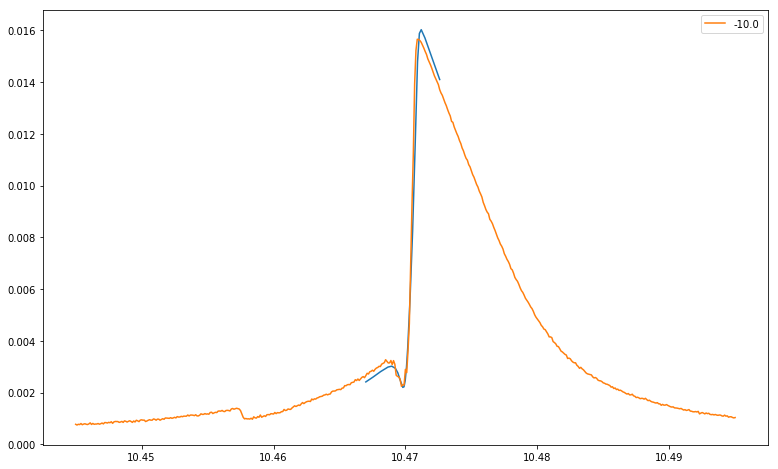

In [39]:
fig, axes = plt.subplots(1,1)
scale = 3.0e-3

lower = 40
upper = 41

for i in range(lower,upper):
    cut = scale*matched_cuts.iloc[:,i]
    cut = cut.dropna()
    axes.plot(cut.index, cut)

dataframe.iloc[:,lower:upper].plot(ax=axes)

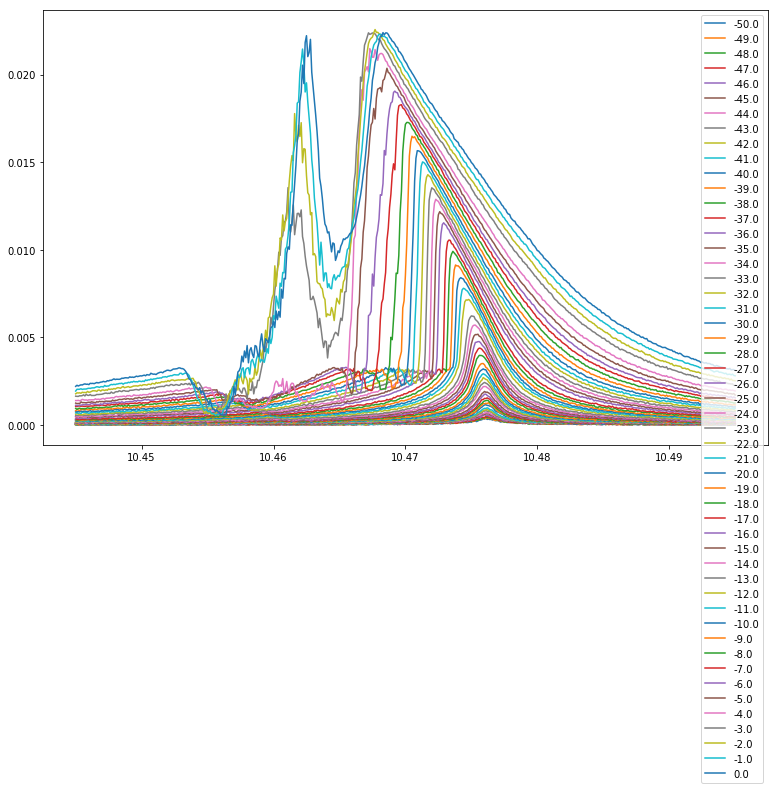

In [40]:
fig, axes = plt.subplots(1,1)

dataframe.plot(ax=axes)

In [ ]:
sweep_path = 'matched_cuts_temperature'

bottom_levels = []
for idx, (dirpath, dirnames, filenames) in enumerate(os.walk(sweep_path)):
    if not dirnames:
        bottom_levels.append(dirpath)
                    
transmissions = np.array([])
frequencies = np.array([])
drives = np.array([])

spectrum = None

for bottom_path in bottom_levels:
    new_spectrum = xr.open_dataset(bottom_path + '/spectrum.nc')
    a_abs = new_spectrum['a_abs']
    new_transmissions = a_abs.data.squeeze()
    transmissions = np.concatenate([transmissions, new_transmissions])
    new_frequencies = a_abs.coords['f_d'].data
    frequencies = np.concatenate([frequencies, new_frequencies])
    drive = a_abs.coords['eps'].data[0]
    new_drives = np.array([drive for idx in range(new_frequencies.shape[0])])
    drives = np.concatenate([drives, new_drives])
    if spectrum is not None:
        spectrum = spectrum.merge(new_spectrum)
    else:
        spectrum = new_spectrum

spectrum = spectrum['a_abs'].squeeze()

In [ ]:
fig, axes = plt.subplots(1,1)
for idx in range(spectrum.shape[1]):
    sweep = spectrum[:,idx].dropna('f_d')
    sweep.plot(ax=axes)
axes.set_title('Simulated cavity spectrum')
axes.set_xlabel('$f_d/GHz$')
axes.set_ylabel(r'$| \langle a \rangle |$')

In [ ]:
spectra_set = xr.open_dataset('./spectra/experimental_spectra.nc')
spectra_set.coords['frequency'] /= 1e9
spectra_set.coords['frequency'] += 0.125
abs_spectra = spectra_set['a_abs']
scale = 55
scaled_x_spectra = scale*abs_spectra

In [ ]:
matched_cuts = load_simulated('matched2')
matched_cuts.sort_index(axis=1, inplace=True)

In [ ]:
fig, axes = plt.subplots(1,1)
scale = 2.95e-3

offset = 30

lower = 0
upper = 6

for i in range(lower,upper):
    cut = scale*matched_cuts.iloc[:,i]
    cut = cut.dropna()
    axes.plot(cut.index, cut, ls='--')

dataframe.iloc[:,lower+offset:upper+offset].plot(ax=axes)